In [ ]:
import numpy as np

In [ ]:
#!unzip "drive/MyDrive/dog-breed-identification.zip" -d "drive/MyDrive"

# End to end multiclass dog breed classification
This notebook builds an end to end multi class image classifier using Tensorflow 2.0 and Tensorflow hub

## 1.Problem
Identifying the breed of dog given the image of a dog

## 2. Data
Data we are using is from Kaggle dog breed classification competition

## 3.Evaluation
The evaluation is a file with predictions probabilities for each dog breed for each test image

## 4.Features
Some information about data:
* We are dealing with images(unstructered data) so we will be using deep/transfer learning
* There are 120 breeds of dogs(multi class classification problem)(heart disease was a binary classification problem)
* 10000+ training images(with labels)
* 10000+ test images (labels we need to predict)


In [ ]:
# Import Tensorflow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF Version:",tf.__version__)
print("TF Hub Version",hub.__version__)

# Check for GPU availaibilty
print("GPU","yes available") if tf.config.list_physical_devices("GPU") else "not available"

TF Version: 2.11.0
TF Hub Version 0.12.0
GPU yes available


## Getting our data ready(Turning into tensors)(numeric representtion)



In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


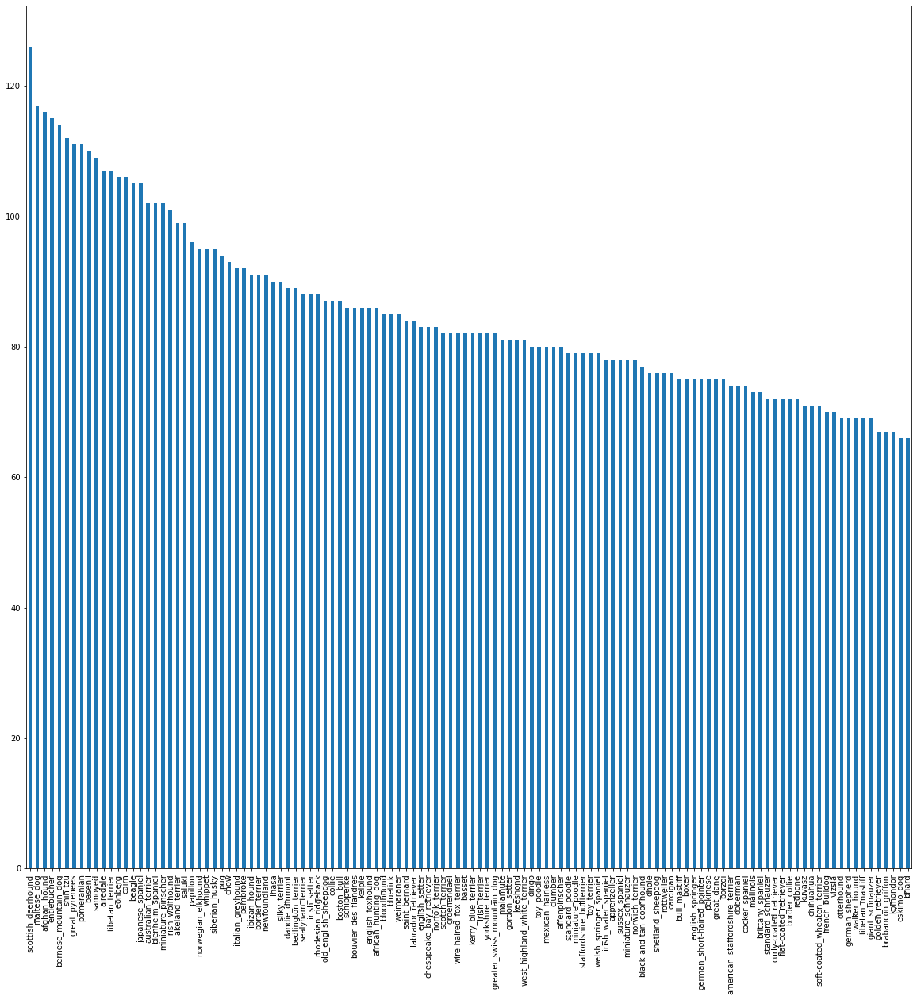

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,20))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
# Getting images and their labels
# Let's get list of our image path filenames

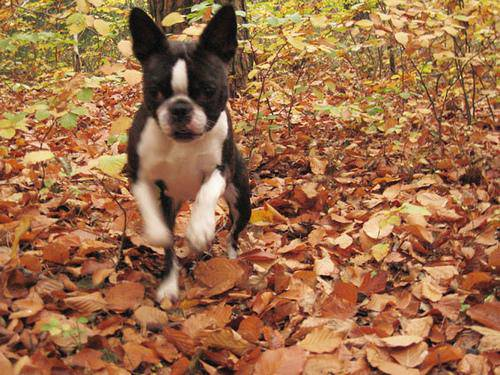

In [ ]:
# Let's view an image
from IPython.display import Image,display
Image("drive/MyDrive/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [ ]:
# Create pathnames from image ID's
filenames=["drive/MyDrive/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]
#/content/drive/MyDrive/train/000bec180eb18c7604dcecc8fe0dba07.jpg


['drive/MyDrive/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
len(os.listdir("drive/MyDrive/train"))

10222

In [ ]:
# Check whether number of filename matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/train"))==len(filenames):
  print("proceed")
else:
  print("No")

proceed


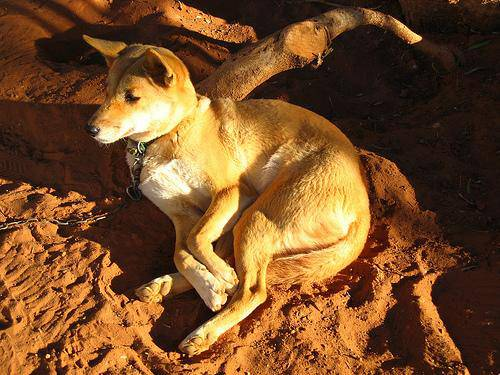

In [ ]:
Image(filenames[1])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
len(filenames)

10222

In [ ]:
# Let's prepare our labels
import numpy as np
labels=labels_csv["breed"].to_numpy()
#labels=np.array(labels)
# does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if len(labels)==len(filenames):
  print("yes")

yes


In [ ]:
# find the unique labels
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds==labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where sample array occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Create our own validation sets
# Set up X and Y variables
X=filenames
y=boolean_labels

In [ ]:
len(X)

10222

# We are going to start with ~10000 images and increase as we need

In [ ]:
# Set number of images to be use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split
# Split them into train and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have geez at train set
X_train[:5],y_train[:2]

(['drive/MyDrive/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fals

# Preprocessing the images(Convert images into Tensors)
To preprocess our images to tensors we are going to write a function which:
1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to variable `image`
3. TURN our `image`(.jpeg) into tensors
4. Resize the `image` to a size of (224,224)
5. Return the modified image.

In [ ]:
 from matplotlib.pyplot import imread
 image=imread(filenames[42])
 image.shape

(257, 350, 3)

In [ ]:
# Convert image to Numpy array
# import numpy as np
# import pandas as pd
# import cv2
# image=cv2.imread(filenames[42])

# from google.colab.patches import cv2_imshow
# cv2_imshow(image)

In [ ]:
# from PIL import Image
# img = Image.open(filenames[42])

In [ ]:
# from skimage import io
# img = io.imread(filenames[42])

In [ ]:
# tf.constant(image)[:2]

In [ ]:
image.max(),image.min() # Each image is combination of red,green,blue and is in range(0,255)

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Define Image Size
IMG_SIZE=224
# Create a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  #Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image

In [ ]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor,channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
#tf.image.convert_image_dtype(tensor,tf.float32)

In [ ]:
process_image(filenames[12],IMG_SIZE)

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.41515437, 0.19946808, 0.1720171 ],
        [0.37869743, 0.17085429, 0.13948174],
        [0.36193058, 0.15503281, 0.12334514],
        ...,
        [0.29701486, 0.10125153, 0.07380054],
        [0.29280463, 0.10064777, 0.07319678],
        [0.29280463, 0.10064777, 0.07319678]],

       [[0.40806067, 0.19237438, 0.1649234 ],
        [0.40548262, 0.19763947, 0.1662669 ],
        [0.37599018, 0.16909242, 0.13740474],
        ...,
        [0.28789535, 0.0939433 , 0.06649231],
        [0.28233546, 0.09017858, 0.06272759],
        [0.28233546, 0.09017858, 0.06272759]],

       [[0.4370794 , 0.22139311, 0.19394213],
        [0.43267584, 0.2248327 , 0.19346014],
        [0.39105853, 0.18416077, 0.15247308],
        ...,
        [0.28235295, 0.09019608, 0.0627451 ],
        [0.2784314 , 0.08627451, 0.05882353],
        [0.2784314 , 0.08627451, 0.05882353]],

       ...,

       [[0.14872189, 0.06765511, 0.0639789 ],
        [0.16

# Turning data into batches
Why turn our data into batches?
Let's say we are trying to process 10000 images at one go..it be possible that they don't get fit into memory.
So that's why we do about 32 image(batch size) at a time (we can manually adjust batch size if need be)
In order to use tensorflow effectively,we need data in the form of tensor tuples which look like `(image,label)`

In [ ]:
# Create a simple function to return a tuple(image,label)
def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
# Demo of above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# Now we have got way to turn our data into tuples of Tensors in the form: `(image,labels)`,lets make a function to convert X and y into batches

In [ ]:
# Define the batch size
BATCH_SIZE=32
# Create a function to convert data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X ) and labels Y data
  Shuffles the data if it is training data but doen't shuffle if it is validation data
  Also accepts test data as input(no labels) (that's why y=None)
  """
  # If data is test data,we don't have labels
  if test_data:
    print("Creating test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths ,no labels
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # If data is validation data,we don't need to shuffle it
  elif valid_data:
    print("Creating validation test batches:")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),#filepaths
                                             tf.constant(y)))#labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data  batches:")
    # Turn filepaths and labels into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))
    # Shuffling labels and filepaths before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))
    #Create (image,label) tupel(this also turns image path into preprocessed image)
    data=data.map(get_image_label)
    # Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Creating training and validation test batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data  batches:
Creating validation test batches:


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

# Visualizing Data Batches
Our data is now in batches,these can little hard to understand so let's visualize them.

In [ ]:
import matplotlib.pyplot as plt
# Create function for viwing image in data batch
def show_25_images(images,labels):
  #Setup the figure:
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)#i+1 is index
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
# For visualising we need to unbatch our data
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

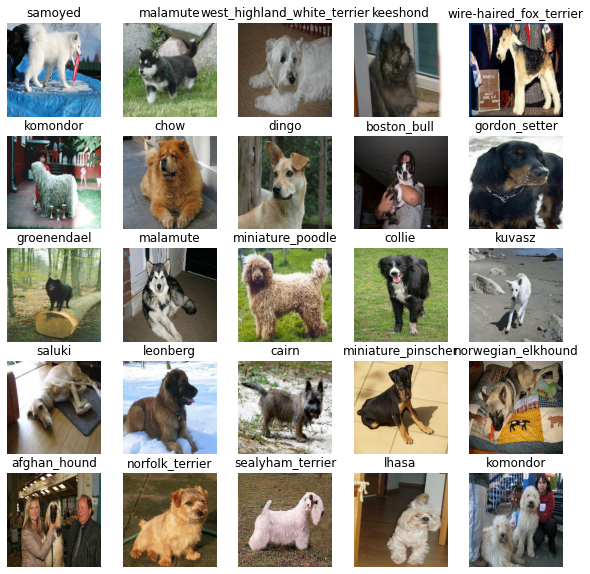

In [ ]:
# Now let's visalize
# every time we run this , output is different as we have shuffled our training data
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

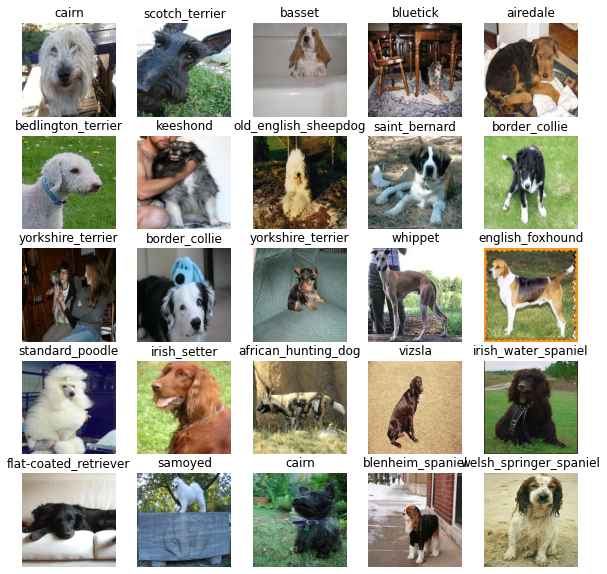

In [ ]:
# Let's visualize our validation set
# It won't change on re running as we don't shuffle in validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

# Building our model
Before we build our model,there are few things we need to define:
1] The input shape(our image shape,in the form of tensors) to our model
2] The output shape(our image labels,in the form of tensors) of our model
3] The URL of the model we want to use
# We will be using transfer learing (already built model) beacuse training from scratch requires time,memory and cost

In [ ]:
# Set up input shape to our model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch,height,width,color channels
# Setup Output shape of our model
OUTPUT_SHAPE=len(unique_breeds)
# Setup Model URL from tensorflow HUB
Model_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we have got our inputs,outputs and model ready to go . let's put them together into a Kera's deep learning model.
Knowing that let's create a function which:
* Takes the input shape,output shape and the model we have chosen as parameters.
* Defines the layers in a Keras model in sequential fashion(do this first,then this,then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model(tells the model the input shape it'll getting)
* Returns the model
# Refer resources of videos (233-236)

In [ ]:
# Create aa function ehich builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=Model_URL):
  print("Building model with:",Model_URL)

  #Setup model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(Model_URL), # Layer 1 (Input Layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") # Layer 2 (Output Layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # Build the Model
  model.build(INPUT_SHAPE)
  return model


In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating Callbacks
Callbacks are helper functions a model can use during training to do such things such as save its progress,check its progress and stop training early if it stops improving(to prevent overfeeding)
We'll create two callbacks , one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long

### Tensorboard Callback
to set up a tensorboard callback, we need to do 3 things:
1.Load the TensorBoard Notebook extension.
2. Create a Tensorboard Callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our models training logs with the `%tensorbard`  magic function(we will do this after model training)

In [ ]:
# Load Tensorboard Notebook extension
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build a TensorBoard Callback
def create_tensorboard_callback():
  # create a log directory for storing tensorflow logs
  logdir=os.path.join("drive/MyDrive/logs",
                      # Make it so that logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callbacks
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving


In [ ]:
# Create an early stopping callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

# Training a model on (on subset of data)
Our first model is going to train on 1000 images,to make sure everything is working . Epoch is number of patterns on our model

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure we are still running on GPU
print("GPU","available)" if tf.config.list_physical_devices("GPU") else "not available:")

GPU available)


## Let's create a function which trains a model:
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the fit function on our model passing it in the training data,validation data,numvber of epochs to train for `(NUM_EPOCHS)` and the callbacks we would like to use.
* Return the model.


In [ ]:
# Build a function to train and return a trained model
def train_model():
  # Create a model
  model=create_model()
  # Create new tensorboard session everytime we train a model
  tensorboard=create_tensorboard_callback()
  #Fit the model to the data passing it in the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  # Return the model
  return model


In [ ]:
# Fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 113s 3s/step - loss: 4.5881 - accuracy: 0.0800 - val_loss: 3.4911 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 3s 116ms/step - loss: 1.6396 - accuracy: 0.6800 - val_loss: 2.2551 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 3s 116ms/step - loss: 0.5790 - accuracy: 0.9262 - val_loss: 1.7500 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 3s 134ms/step - loss: 0.2601 - accuracy: 0.9837 - val_loss: 1.5436 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1501 - accuracy: 0.9975 - val_loss: 1.4763 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1030 - accuracy: 1.0000 - val_loss: 1.4196 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

In [ ]:
# # Checking the tensorboard logs
# The tensorboard magic function (% tensorboard) will access the log directory we created earlier and visulize its contents

In [ ]:
%tensorboard --logdir drive/MyDrive/logs

<IPython.core.display.Javascript object>

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Making predictions on the validation data
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 4s 88ms/step


array([[3.3769611e-04, 6.4911947e-05, 1.5007434e-03, ..., 3.0650964e-04,
        1.0663560e-04, 5.0306474e-03],
       [9.0972922e-04, 4.3489394e-04, 5.4784093e-02, ..., 1.1934079e-03,
        6.5576221e-04, 1.3236032e-04],
       [6.8262812e-06, 8.1631733e-06, 3.4947207e-05, ..., 1.1375498e-04,
        3.4435237e-05, 1.1461377e-03],
       ...,
       [4.3535987e-05, 4.2634725e-05, 2.8028095e-04, ..., 8.3945943e-06,
        1.3181052e-04, 2.9604933e-05],
       [2.2936100e-03, 2.1772998e-04, 1.1859356e-04, ..., 8.5956548e-05,
        2.0241152e-05, 1.0483372e-02],
       [1.1143590e-03, 6.0390776e-05, 2.0862015e-05, ..., 2.9957865e-03,
        5.6848757e-04, 1.1490113e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val),len(unique_breeds)

(200, 120)

In [ ]:
predictions[0] # len of it is 120. its kind of probability our model thinks for every image corresponding to unique labels

array([3.3769611e-04, 6.4911947e-05, 1.5007434e-03, 2.3431678e-05,
       7.9437258e-04, 6.5116372e-05, 8.9133326e-03, 2.7642172e-04,
       1.7067773e-04, 3.2950426e-04, 9.5035695e-04, 1.4124272e-04,
       1.9880176e-04, 1.1812875e-04, 3.0120704e-04, 1.7141291e-03,
       5.9570244e-05, 1.4723335e-01, 3.6886380e-05, 1.2688361e-04,
       7.8940036e-05, 1.2798369e-04, 9.5914838e-06, 3.5430127e-04,
       2.9543176e-04, 7.6817574e-05, 3.8349298e-01, 1.9690295e-04,
       5.7863252e-04, 1.2832382e-04, 2.0433294e-04, 4.3063663e-04,
       1.2672966e-04, 9.0700423e-06, 1.4304135e-04, 2.7652569e-02,
       3.4474775e-05, 1.9588554e-04, 4.6387428e-05, 3.0506452e-04,
       2.8449243e-03, 8.1440427e-05, 2.0716923e-04, 1.8172759e-04,
       1.9504734e-05, 1.2365852e-04, 5.3137616e-04, 2.1140290e-04,
       8.5730615e-05, 3.5513111e-04, 2.9835230e-05, 4.0423540e-05,
       8.0059987e-04, 4.3311629e-05, 3.2695170e-04, 2.0061225e-05,
       4.0098901e-05, 2.2062897e-03, 1.2632494e-03, 2.2810753e

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First Prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[4.6183381e-05 1.0474938e-04 5.1818417e-05 1.0198881e-04 1.3363114e-02
 7.2304544e-04 1.9590431e-04 1.2624059e-03 5.7093105e-03 2.0199664e-02
 4.4745138e-05 7.4868967e-06 1.5240683e-03 1.7906396e-03 1.0411245e-03
 1.6341802e-03 3.7576057e-05 9.0171269e-04 1.5168283e-04 1.7783769e-04
 8.0166101e-06 1.0171707e-03 2.6861182e-04 4.3635730e-05 6.6144043e-03
 5.3106734e-05 1.1869627e-04 1.3578788e-04 2.2378247e-04 8.7111104e-05
 8.1684855e-05 1.1865880e-04 3.1675256e-04 1.7721441e-05 2.7281660e-05
 4.7960781e-05 2.4640805e-04 1.1896387e-03 2.1924808e-04 4.4616929e-01
 3.0939947e-04 6.7547488e-05 4.0883054e-03 3.1040730e-05 6.0523173e-04
 7.6237833e-05 1.3643679e-04 1.1072734e-03 1.7086540e-04 3.7831691e-04
 6.1660437e-05 6.8887003e-04 3.0623670e-04 3.2098200e-03 4.4187040e-05
 4.3286229e-04 1.4189760e-03 2.6640077e-05 1.4557569e-04 2.5003709e-04
 2.4486861e-05 1.2167253e-03 6.7167661e-05 2.8581093e-05 2.1542738e-04
 7.0185648e-05 3.7136881e-04 1.7612424e-03 7.3316827e-04 1.7726014e-04
 9.556

Having the above functionality is great but we want to do it at scale
And it would be even better if we could see the image on which the prediction is being made on
Note:Prediction Probabilites are also known as confidence values

In [ ]:
from tensorflow.python.framework.config import get_intra_op_parallelism_threads
# Turn the prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label:
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[0])
pred_label

'cairn'

Now since our validation data is still in a batch dataset, we will have to unbatchify it to make the predcitions on the validation images and then compare those predictions to the validation_labels(truth_labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns seperate arrays of images and labels

  """
  images=[]
  labels=[]
  # Loop through unbatched data
  for image,label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
# Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)


In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

In [ ]:
# Create a function to unbatch a batch dataset
images_=[]
labels_=[]
# Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

Now we have got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visualize
We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted label
* Plot the predicted label,its predicted probability , the truth label and target image on a single plot

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction,ground truth and image for sample
  """
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong:
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted , probability of prediction and truth label
  plt.title(" {} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

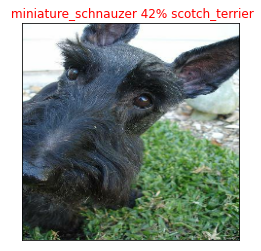

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images)

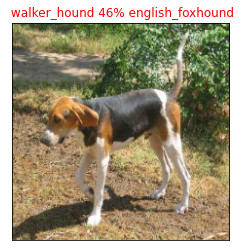

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=42)

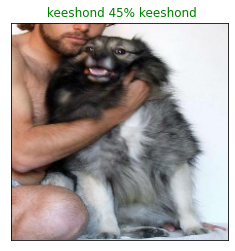

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=6)

Now we've got our function to visualize our model's top prediction, let's make another to view our model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using get_pred_label().
* Find the top 10:
* Prediction probabililties indexes
* Prediction probabililties values
* Prediction labels
* Plot the top 10 prediction probabaility values and labels,coloring the true label green

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.38349298, 0.14723335, 0.07596131, 0.0604314 , 0.05262297,
       0.04953925, 0.02765257, 0.02380618, 0.02281075, 0.01624546],
      dtype=float32)

In [ ]:
predictions[0].max()

0.38349298

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
   """
   Plus the top 10 highest prediction confidences along with the truth labels
   """
   pred_prob,true_label=prediction_probabilities[n],labels[n]

   # Get the predicted label
   pred_label = get_pred_label(pred_prob)
   # Find the top 10 prediction confidence indexes
   top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
   # Find the top 10 prediction confidence values
   top_10_pred_values=pred_prob[top_10_pred_indexes]
   # Find the top 10 prediction labels
   top_10_pred_labels=unique_breeds[top_10_pred_indexes]

   # Setup plot
   top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")
   plt.xticks(np.arange(len(top_10_pred_labels)),
              labels=top_10_pred_labels,
              rotation="vertical")
   # Change color of true label
   if np.isin(true_label,top_10_pred_labels):
     top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
   else:
      pass

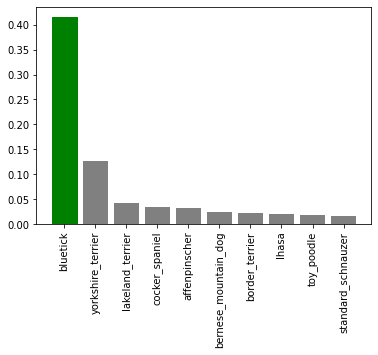

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=3)

Now we have got some function to help us visualize our predivctions and evealuate our model,let's check out

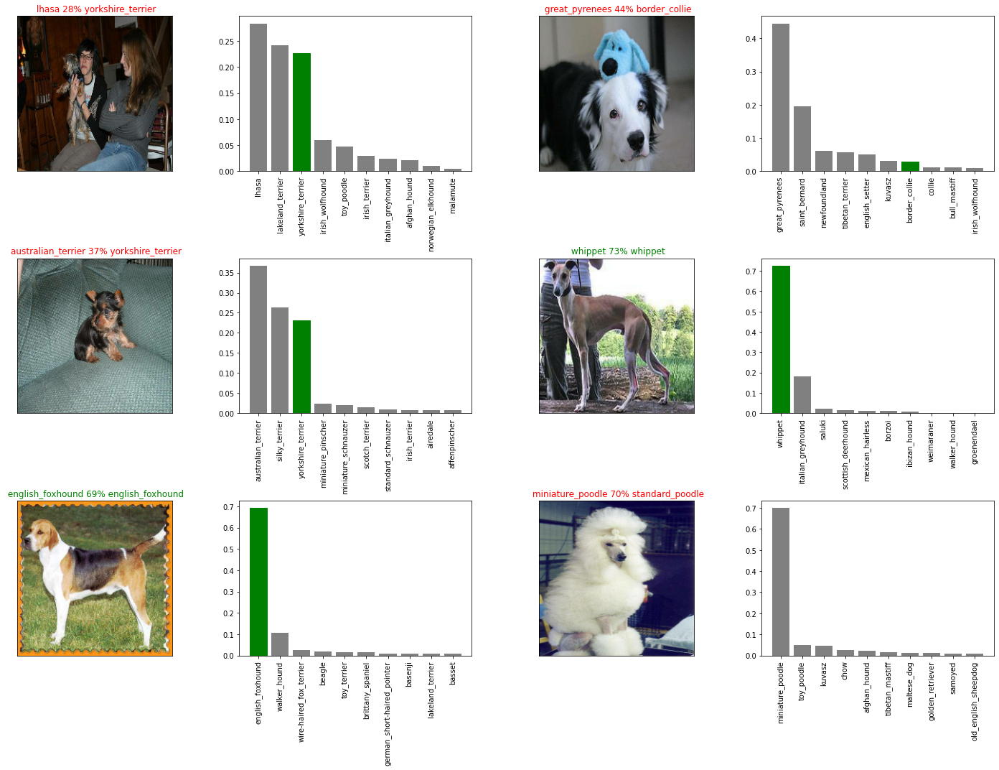

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/DogVisModels",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "_" + suffix + ".h5" #Save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specefied path
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVisModels/20230221-09161676970979_1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVisModels/20230221-09161676970979_1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model=load_model('drive/MyDrive/DogVisModels/20230221-09161676970979_1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVisModels/20230221-09161676970979_1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate presaved model
model.evaluate(val_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.3289 - accuracy: 0.6650


[1.3288798332214355, 0.6650000214576721]

In [ ]:
# Evaluate loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 118ms/step - loss: 1.3289 - accuracy: 0.6650


[1.3288798332214355, 0.6650000214576721]

# Training model on full data

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full dataset
full_data=create_data_batches(X,y)

Creating training data  batches:


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
# No validation set while training on full data , so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# fit the full model to full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 38s 100ms/step - loss: 1.3339 - accuracy: 0.6705
Epoch 2/100
320/320 [==============================] - 33s 101ms/step - loss: 0.4015 - accuracy: 0.8821
Epoch 3/100
320/320 [==============================] - 33s 103ms/step - loss: 0.2368 - accuracy: 0.9369
Epoch 4/100
320/320 [==============================] - 32s 100ms/step - loss: 0.1508 - accuracy: 0.9635
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1076 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0783 - accuracy: 0.9847
Epoch 7/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0591 - accuracy: 0.9918
Epoch 8/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0470 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0371 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 34s 106ms/

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/DogVisModels/20230221-09491676972969_full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/DogVisModels/20230221-09491676972969_full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model=load_model('drive/MyDrive/DogVisModels/20230221-09491676972969_full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/DogVisModels/20230221-09491676972969_full-image-set-mobilenetv2-Adam.h5


# Making predictions on test data
Since our model has been trained on images in the form of Tensor Batches, to make predictions on the test data, we wil have to get into the same format
Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches
To make predictions on the test data we'll:
* Get the test images filenames
* Convert the filenames into data batches using `create_data_batches` and setting the testdata  parameter to true (test data don't have labels)
* Make a prediction array by passing the test batches to `predict()` method called on our model


In [ ]:
# Load test images filenames
test_path="drive/MyDrive/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/test/e6920cc0fd2e3099506d23761d9682e1.jpg',
 'drive/MyDrive/test/e4413cd1ee44a05cc7991ae0d097b062.jpg',
 'drive/MyDrive/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 'drive/MyDrive/test/df0d6ba158287cb2b3ed6459a22d42ba.jpg',
 'drive/MyDrive/test/dfa54e85c1309d8a9933deedc1d775c7.jpg',
 'drive/MyDrive/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/MyDrive/test/e0d51afc60c25eb2205be1644af09cc5.jpg',
 'drive/MyDrive/test/e15513ca7ebb4730731f34c25e906502.jpg',
 'drive/MyDrive/test/de5496c6b58f66ab890ab24087d9e220.jpg',
 'drive/MyDrive/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data batches


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on test data
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 33s 102ms/step


In [ ]:
# save predictions (Numpy array) to csv file
np.savetxt("drive/MyDrive/preds_array.csv",test_predictions,delimiter=",")


In [ ]:
# load predictions from csv file
test_predictions=np.loadtxt("drive/MyDrive/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[2.58052584e-08, 5.78748551e-12, 5.15563460e-11, ...,
        1.02513331e-09, 5.43684726e-13, 2.24001506e-09],
       [6.76507128e-10, 1.85748542e-10, 1.41403597e-10, ...,
        1.43235354e-06, 1.01578657e-08, 4.31103847e-10],
       [6.54154009e-10, 6.59523947e-09, 6.75826894e-11, ...,
        2.00277861e-09, 1.98167090e-05, 4.04045492e-10],
       ...,
       [8.60859739e-09, 3.14350984e-07, 2.83356533e-10, ...,
        5.74494663e-07, 7.71100730e-08, 2.91764377e-12],
       [1.42954268e-11, 2.50604699e-05, 1.44936674e-09, ...,
        2.39947508e-06, 7.41954054e-08, 7.15812045e-12],
       [4.00622834e-11, 5.73950270e-14, 7.20515592e-11, ...,
        4.49772469e-10, 2.83616131e-09, 2.35646789e-13]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models predictions outputs in a csv file with an ID and a column for each different dog breeds.
To get the data in this format, we'll:
* Create a pandas dataframe with an Id column as well as column for each dog breed
* Add data to the Id Column by extracting the test image Id's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed column.
* Export the dataframe as a CSV to submit it to Kaggle.

In [ ]:
# create a pandas Dataframe with empty columns
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image Id's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6920cc0fd2e3099506d23761d9682e1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4413cd1ee44a05cc7991ae0d097b062,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e5a78d4d53fc5957cc9dedd318139d3d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,df0d6ba158287cb2b3ed6459a22d42ba,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dfa54e85c1309d8a9933deedc1d775c7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/test/e6920cc0fd2e3099506d23761d9682e1', '.jpg')

In [ ]:
# Add the prediction probabilities to each breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6920cc0fd2e3099506d23761d9682e1,2.580526e-08,5.787486e-12,5.155635e-11,4.182972e-11,3.083855e-10,1.860568e-10,3.102784e-13,1.622944e-09,3.353967e-10,...,6.520280e-11,9.339549e-11,1.241705e-11,1.905489e-11,5.838065e-08,1.315690e-12,6.763018e-12,1.025133e-09,5.436847e-13,2.240015e-09
1,e4413cd1ee44a05cc7991ae0d097b062,6.765071e-10,1.857485e-10,1.414036e-10,2.006645e-09,3.392669e-08,4.170798e-06,1.636415e-08,2.313801e-07,7.363075e-07,...,1.477995e-08,2.022274e-10,7.845798e-09,1.042811e-04,6.958393e-09,6.083555e-09,1.061765e-09,1.432354e-06,1.015787e-08,4.311038e-10
2,e5a78d4d53fc5957cc9dedd318139d3d,6.541540e-10,6.595239e-09,6.758269e-11,2.475407e-07,5.437011e-08,5.540759e-08,6.341070e-08,2.674209e-08,1.526519e-05,...,1.990375e-09,7.099255e-07,1.238000e-03,5.995266e-05,4.024461e-08,1.374793e-10,2.571703e-12,2.002779e-09,1.981671e-05,4.040455e-10
3,df0d6ba158287cb2b3ed6459a22d42ba,6.885789e-05,6.366907e-08,3.847676e-07,3.766628e-06,7.432473e-04,3.121428e-07,1.013604e-06,9.044282e-08,5.433275e-09,...,4.106672e-07,1.301470e-03,4.895489e-07,2.223358e-06,2.327258e-06,3.715034e-10,9.389685e-07,8.432981e-08,4.954369e-06,5.259644e-08
4,dfa54e85c1309d8a9933deedc1d775c7,2.634625e-06,1.045036e-07,1.268407e-10,1.846557e-09,2.803084e-08,8.649454e-11,6.048519e-14,1.633329e-11,1.724869e-12,...,1.207945e-09,1.306320e-12,2.782081e-12,1.781451e-10,4.693816e-12,2.350002e-12,1.553706e-13,4.833498e-10,5.811781e-10,7.875958e-11


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/full_model(DogVis)_prediction_submission.csv",index=False)

# making predictions on custom images
To make predictions on custom images,we'll:
* Get the filepaths of our images.
* Turn the filepaths into databatches using `create_data_batches()`.And since our custom images won't have labels , we set test_data parameter to true
* Pass the custom image batch data to our model's predict method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to custom images